In [98]:
import tensorflow as tf

In [99]:
daily_sales_numbers = [21,22,-10,31,23,-34,45,-93]

tf_dataset = tf.data.Dataset.from_tensor_slices(daily_sales_numbers)
tf_dataset

<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.int32, name=None)>

In [100]:
for sales in tf_dataset:
    print(sales.numpy())

21
22
-10
31
23
-34
45
-93


In [101]:
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

21
22
-10
31
23
-34
45
-93


In [102]:
for sales in tf_dataset.take(3):
    print(sales.numpy())

21
22
-10


In [103]:
tf_dataset = tf_dataset.filter(lambda x:x>0)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

21
22
31
23
45


In [104]:
tf_dataset = tf_dataset.map(lambda x: x*84)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

1764
1848
2604
1932
3780


In [105]:
tf_dataset = tf_dataset.shuffle(3)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

1848
1764
1932
3780
2604


In [106]:
for sales_batch in tf_dataset.batch(3):
    print(sales_batch.numpy())

[1764 1932 3780]
[2604 1848]


In [107]:
tf_dataset = tf.data.Dataset.from_tensor_slices(daily_sales_numbers)

tf_dataset = tf_dataset.filter(lambda x: x>0).map(lambda y: y*72).shuffle(2).batch(2)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

[1512 2232]
[1656 1584]
[3240]


In [108]:
import os

In [109]:
data_path = r'F:\Big Files\flower_photos'

In [110]:
images_ds = tf.data.Dataset.list_files(os.path.join(data_path, '*/*'), shuffle=False)

In [111]:
images_ds

<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [112]:
image_count = len(list(images_ds))
print("Total images:", image_count)

Total images: 3670


In [113]:
images_ds = images_ds.shuffle(image_count)

In [114]:
train_size = int(image_count * 0.8)
train_ds = images_ds.take(train_size)
test_ds = images_ds.skip(train_size)
print("Train size:", train_size, "Test size:", image_count - train_size)

Train size: 2936 Test size: 734


In [115]:
class_names = ["daisy", "dandelion", "roses", "sunflowers", "tulips"]

In [116]:
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    
    return parts[-2]

In [117]:
def process_image(file_path):
    label = get_label(file_path)
    
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [128, 128])
    return img, label

In [118]:
train_ds = train_ds.map(process_image)
test_ds = test_ds.map(process_image)

In [119]:
def scale(image, label):
    return image / 255.0, label

train_ds = train_ds.map(scale)
test_ds = test_ds.map(scale)

In [120]:
for image, label in train_ds.take(5):
    print("****Image pixel sample: ", image.numpy()[0][0])
    print("****Label: ", label.numpy())

****Image pixel sample:  [0.4526949  0.65234375 0.83146566]
****Label:  b'sunflowers'
****Image pixel sample:  [0.01568628 0.07450981 0.        ]
****Label:  b'dandelion'
****Image pixel sample:  [0.14840686 0.20294118 0.08792557]
****Label:  b'tulips'
****Image pixel sample:  [0.28154105 0.35507047 0.32789522]
****Label:  b'tulips'
****Image pixel sample:  [0.06335784 0.2408701  0.0442402 ]
****Label:  b'dandelion'


In [121]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import random

In [122]:
def get_images_for_class(class_name):
    class_path = os.path.join(data_path, class_name)
    return [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith(('jpg','jpeg','png'))]


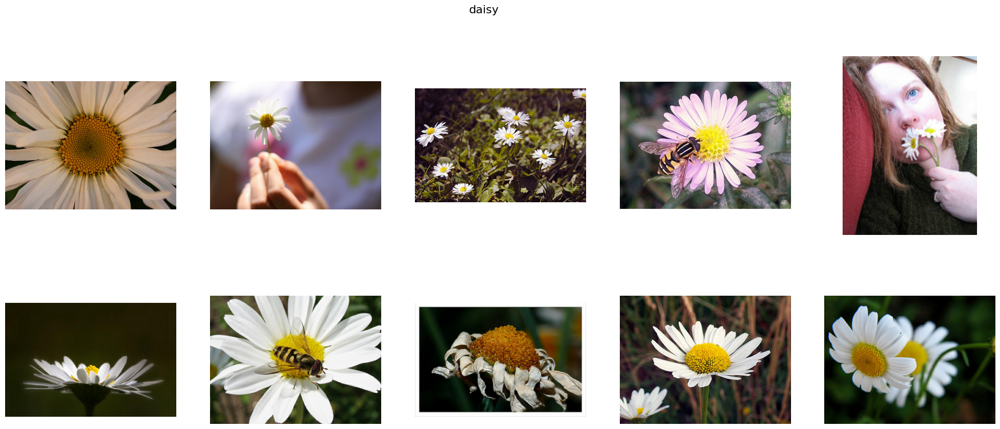

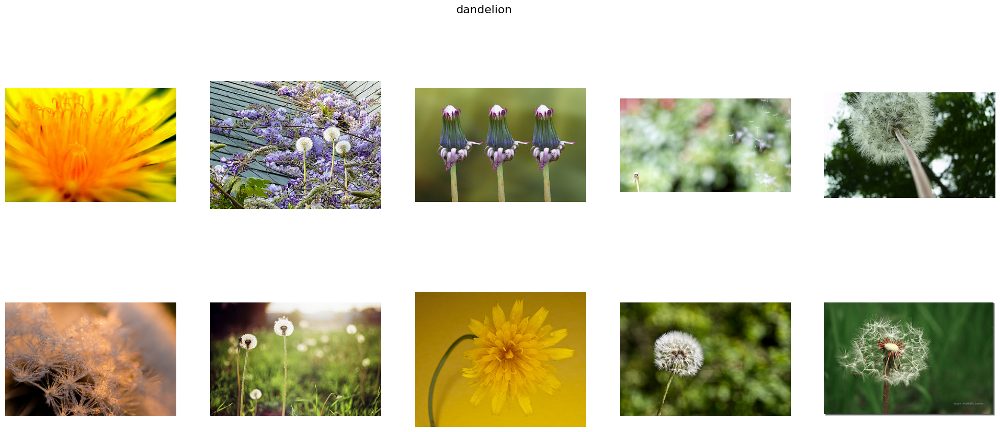

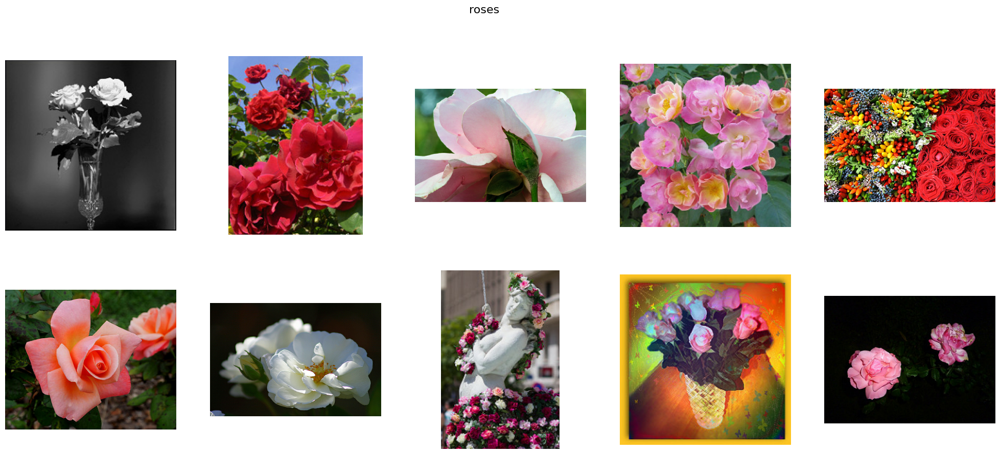

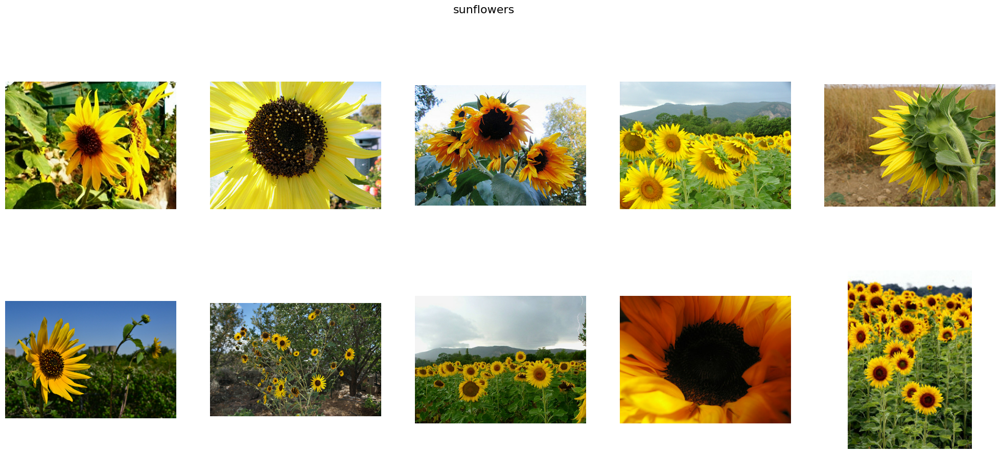

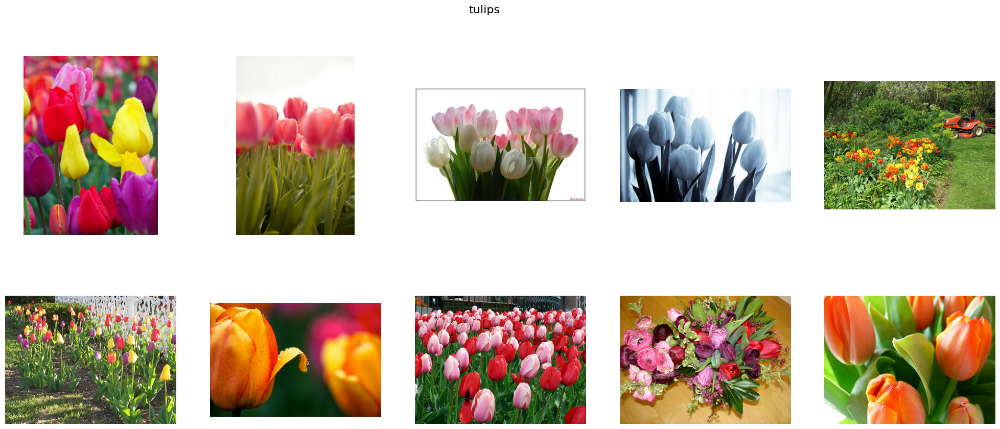

In [123]:
for class_name in class_names:
    images = get_images_for_class(class_name)
    sample_images = random.sample(images, 10) 
    plt.figure(figsize=(25,10))
    plt.suptitle(class_name, fontsize=16)
    for i, img_path in enumerate(sample_images):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)
        plt.subplot(2, 5, i+1)
        plt.imshow(img.numpy().astype("uint8"))
        plt.axis('off')
    plt.show()

In [124]:
import os

data_path = r'F:\Big Files\flower_photos'
flower_class = "daisy"  # choose the flower you want to inspect

class_path = os.path.join(data_path, flower_class)
image_paths = [os.path.join(class_path, f) for f in os.listdir(class_path) 
               if f.lower().endswith(('jpg', 'jpeg', 'png'))]

# Print all image paths
for path in image_paths:
    print(path)


F:\Big Files\flower_photos\daisy\100080576_f52e8ee070_n.jpg
F:\Big Files\flower_photos\daisy\10140303196_b88d3d6cec.jpg
F:\Big Files\flower_photos\daisy\10172379554_b296050f82_n.jpg
F:\Big Files\flower_photos\daisy\10172567486_2748826a8b.jpg
F:\Big Files\flower_photos\daisy\10172636503_21bededa75_n.jpg
F:\Big Files\flower_photos\daisy\102841525_bd6628ae3c.jpg
F:\Big Files\flower_photos\daisy\1031799732_e7f4008c03.jpg
F:\Big Files\flower_photos\daisy\10391248763_1d16681106_n.jpg
F:\Big Files\flower_photos\daisy\10437754174_22ec990b77_m.jpg
F:\Big Files\flower_photos\daisy\10437770546_8bb6f7bdd3_m.jpg
F:\Big Files\flower_photos\daisy\10437929963_bc13eebe0c.jpg
F:\Big Files\flower_photos\daisy\10466290366_cc72e33532.jpg
F:\Big Files\flower_photos\daisy\10466558316_a7198b87e2.jpg
F:\Big Files\flower_photos\daisy\10555749515_13a12a026e.jpg
F:\Big Files\flower_photos\daisy\10555815624_dc211569b0.jpg
F:\Big Files\flower_photos\daisy\10555826524_423eb8bf71_n.jpg
F:\Big Files\flower_photos\dais